# Performing Sentiment Analysis on Youtube comments

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

In [5]:
comments=pd.read_csv(r'C:\Users\Balamurugan S\Data Analytics projects\1-Youtube Text Data Analysis\GBcomments.csv',error_bad_lines=False)

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [7]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
#pip install textblob

In [8]:
from textblob import TextBlob

In [9]:
TextBlob('Thank gosh, a place I can watch it without hav...').sentiment.polarity

0.0

In [10]:
comments.isna().sum()

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [12]:
comments.dropna(inplace=True)

In [13]:
polarity=[]
for i in comments['comment_text']:
    polarity.append(TextBlob(i).sentiment.polarity)
    

In [14]:
#Adding polarity list value to the dataset
comments['polarity']=polarity
comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


## Exploratory Data Analysis on Poistive and Negative comments on youtube 

In [11]:
comments_positive=comments[comments['polarity']==1]

In [12]:
comments_positive.shape

(20400, 5)

In [13]:
#pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [14]:
from wordcloud import WordCloud,STOPWORDS

In [15]:
stopwords=set(STOPWORDS)

In [16]:
comments_positive.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [19]:
total_comments=''.join(comments_positive['comment_text'])

In [20]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

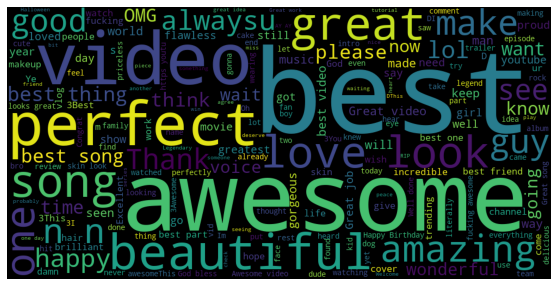

In [21]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

In [24]:
comments_negative=comments[comments['polarity']==-1]

In [26]:
total_comments=''.join(comments_negative['comment_text'])

In [27]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

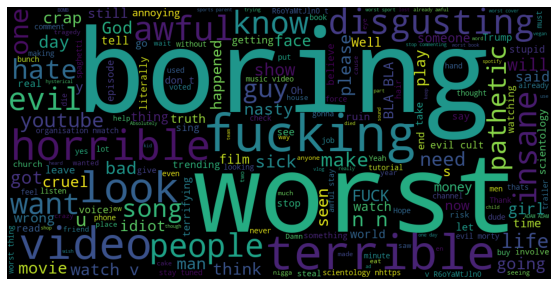

In [29]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')


## Analysing Trending tags and views on youtube 

In [31]:
#2020 indian trending dataset
videos=pd.read_csv(r'C:\Users\Balamurugan S\Data Analytics projects\1-Youtube Text Data Analysis\IN_youtube_trending_data.csv')

In [32]:
videos.head()

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,Iot0eF6EoNA,Sadak 2 | Official Trailer | Sanjay | Pooja | ...,2020-08-12T04:31:41Z,UCGqvJPRcv7aVFun-eTsatcA,FoxStarHindi,24,2020-08-12T00:00:00Z,sadak|sadak 2|mahesh bhatt|vishesh films|pooja...,9885899,224925,3979409,350210,https://i.ytimg.com/vi/Iot0eF6EoNA/default.jpg,False,False,Three Streams. Three Stories. One Journey. Sta...
1,x-KbnJ9fvJc,Kya Baat Aa : Karan Aujla (Official Video) Tan...,2020-08-11T09:00:11Z,UCm9SZAl03Rev9sFwloCdz1g,Rehaan Records,10,2020-08-12T00:00:00Z,[None],11308046,655450,33242,405146,https://i.ytimg.com/vi/x-KbnJ9fvJc/default.jpg,False,False,Singer/Lyrics: Karan Aujla Feat Tania Music/ D...
2,KX06ksuS6Xo,Diljit Dosanjh: CLASH (Official) Music Video |...,2020-08-11T07:30:02Z,UCZRdNleCgW-BGUJf-bbjzQg,Diljit Dosanjh,10,2020-08-12T00:00:00Z,clash diljit dosanjh|diljit dosanjh|diljit dos...,9140911,296533,6179,30058,https://i.ytimg.com/vi/KX06ksuS6Xo/default.jpg,False,False,CLASH official music video performed by DILJIT...
3,UsMRgnTcchY,Dil Ko Maine Di Kasam Video | Amaal M Ft.Ariji...,2020-08-10T05:30:49Z,UCq-Fj5jknLsUf-MWSy4_brA,T-Series,10,2020-08-12T00:00:00Z,hindi songs|2020 hindi songs|2020 new songs|t-...,23564512,743931,84162,136942,https://i.ytimg.com/vi/UsMRgnTcchY/default.jpg,False,False,Gulshan Kumar and T-Series presents Bhushan Ku...
4,WNSEXJJhKTU,"Baarish (Official Video) Payal Dev,Stebin Ben ...",2020-08-11T05:30:13Z,UCye6Oz0mg46S362LwARGVcA,VYRLOriginals,10,2020-08-12T00:00:00Z,VYRL Original|Mohsin Khan|Shivangi Joshi|Payal...,6783649,268817,8798,22984,https://i.ytimg.com/vi/WNSEXJJhKTU/default.jpg,False,False,VYRL Originals brings to you ‘Baarish’ - the b...


In [35]:
tags_complete=''.join(videos['tags'])

In [36]:
import re

In [38]:
tags=re.sub('[^a-zA-Z]' ,' ',tags_complete)

In [39]:
tags

'sadak sadak   mahesh bhatt vishesh films pooja bhatt alia bhatt sanjay dutt aditya roy kapur alia bhatt movies alia bhatt new movies aditya roy kapur new movies aditya roy kapur movies sanjay dutt sadak   sanjay dutt sadak sanjay dutt new movies fox star studios fox star hindi disney plus hotstar disney plus movie bollywood cinema movie hindi cinema upcoming bollywood movie love story action thriller suspense None clash diljit dosanjh diljit dosanjh diljit dosanjh goat album diljit dosanjh new album punjabi songs      punjabi new song new song      goat diljit dosanjh the kidd punjabi music the kidd music raj ranjodh songs goat diljit dosanjh full album diljit dosanjh karan aujla song Diljit dosanjh new songs diljit dosanjh songs goat diljit dosanjh      goat      latest punjabi songs      punajbi      latest songs punjabi songs punjabi new songs punjabi clashhindi songs      hindi songs      new songs t series tseries tseries songs new song hit songs           songs hindi      songs 

In [40]:
tags= re.sub(' +',' ',tags)

In [41]:
wordcloud=WordCloud(width=1000,height=500,stopwords=set(STOPWORDS)).generate(tags)

(-0.5, 999.5, 499.5, -0.5)

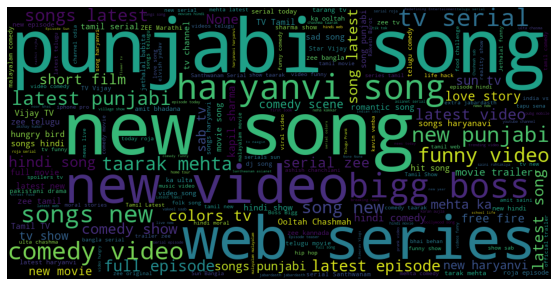

In [42]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

Performing Analysis on likes,views and dislikes and co-relation between them

Text(0.5, 1.0, 'Regression plot for views and Likes in India 2020')

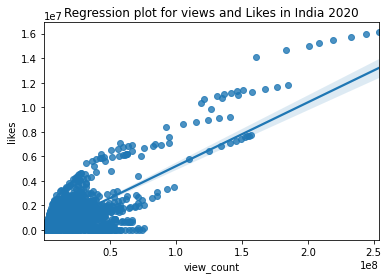

In [44]:
sns.regplot(data=videos,x='view_count',y='likes')
plt.title('Regression plot for views and Likes in India 2020')

Text(0.5, 1.0, 'Regression plot for views and Dislikes in India 2020')

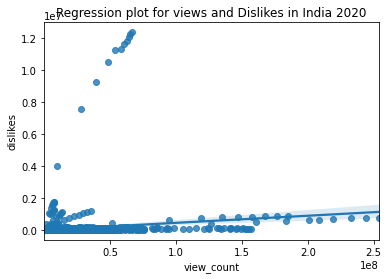

In [45]:
sns.regplot(data=videos,x='view_count',y='dislikes')
plt.title('Regression plot for views and Dislikes in India 2020')

In [46]:
df_corr=videos[['view_count','likes','dislikes']]

In [47]:
df_corr.corr()

,view_count,likes,dislikes
view_count,1.000000,0.818999,0.188261
likes,0.818999,1.000000,0.092458
dislikes,0.188261,0.092458,1.000000


<AxesSubplot:>

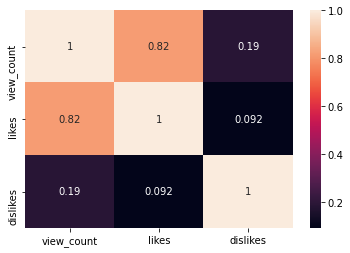

In [50]:
sns.heatmap(df_corr.corr(),annot=True)